# Dataset
### https://www.kaggle.com/datasets/uwrfkaggler/ravdess-emotional-speech-audio

In [84]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-08-01-01-01-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-01-01-01-01-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-07-02-01-02-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-07-01-01-02-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-01-01-02-01-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-06-02-02-01-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-04-01-02-01-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-01-01-01-02-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-02-01-01-02-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-03-01-01-01-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-07-01-02-02-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-05-01-01-02-02.wav
/kaggle/input/ravdess-emotional-speech-audio/Actor_0

In [85]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import IPython.display as ipd
import scipy

In [86]:
a1 = '/kaggle/input/ravdess-emotional-speech-audio/Actor_01/03-01-01-01-01-01-01.wav'
ipd.Audio(a1)

In [87]:
a2 = '/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-01-01-01-01-02.wav'
ipd.Audio(a2)

In [88]:
a3 = '/kaggle/input/ravdess-emotional-speech-audio/Actor_03/03-01-01-01-01-01-03.wav'
ipd.Audio(a3)

In [89]:
a10 = '/kaggle/input/ravdess-emotional-speech-audio/Actor_10/03-01-01-01-01-01-10.wav'
ipd.Audio(a10)

In [90]:
a24 = '/kaggle/input/ravdess-emotional-speech-audio/Actor_24/03-01-01-01-01-01-24.wav'
ipd.Audio(a24)

In [91]:
aud_1, sr = librosa.load(a1)
aud_2, _ = librosa.load(a2)
aud_3, _ = librosa.load(a3)
aud_10, _ = librosa.load(a10)
aud_24, _ = librosa.load(a24)



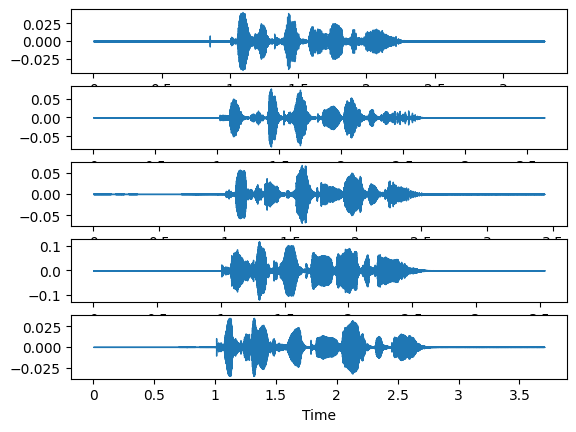

In [92]:
plt.subplot(511)
librosa.display.waveshow(aud_1)
plt.subplot(512)
librosa.display.waveshow(aud_2)
plt.subplot(513)
librosa.display.waveshow(aud_3)
plt.subplot(514)
librosa.display.waveshow(aud_10)
plt.subplot(515)
librosa.display.waveshow(aud_24)


In [93]:
aud_1_trim = librosa.effects.trim(aud_1, top_db=20)[0]
aud_2_trim = librosa.effects.trim(aud_2, top_db=20)[0]
aud_3_trim = librosa.effects.trim(aud_3,top_db=20)[0]
aud_10_trim = librosa.effects.trim(aud_10, top_db=20)[0]
aud_24_trim = librosa.effects.trim(aud_24, top_db=20)[0]



In [94]:
print(librosa.get_duration(y=aud_1), librosa.get_duration(y=aud_1_trim))


3.3033106575963718 1.230657596371882


In [95]:
ipd.Audio(data=aud_1_trim, rate=sr)

In [96]:
ipd.Audio(data=aud_2_trim, rate=sr)

In [97]:
ipd.Audio(data=aud_3_trim, rate=sr)

In [98]:
ipd.Audio(data=aud_10_trim, rate=sr)

In [99]:
ipd.Audio(data=aud_24_trim, rate=sr)

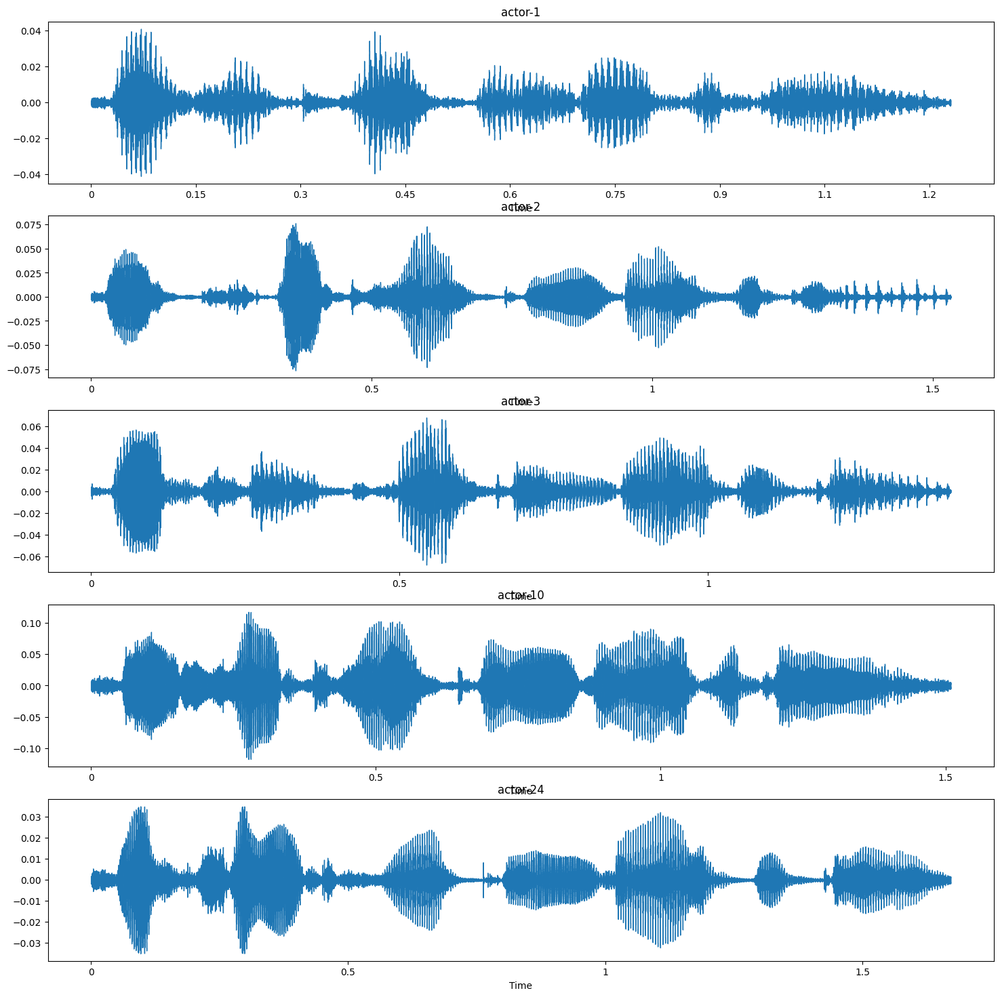

In [100]:
plt.figure(figsize=(18,18))
plt.subplot(511)
librosa.display.waveshow(aud_1_trim)
plt.title("actor-1")
plt.subplot(512)
librosa.display.waveshow(aud_2_trim)
plt.title("actor-2")
plt.subplot(513)
librosa.display.waveshow(aud_3_trim)
plt.title("actor-3")
plt.subplot(514)
librosa.display.waveshow(aud_10_trim)
plt.title("actor-10")
plt.subplot(515)
librosa.display.waveshow(aud_24_trim)
plt.title("actor-24")
plt.show()


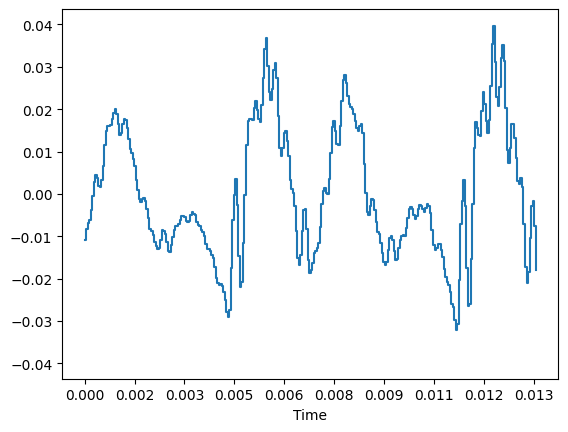

In [101]:

librosa.display.waveshow(aud_1_trim[1000:1300])


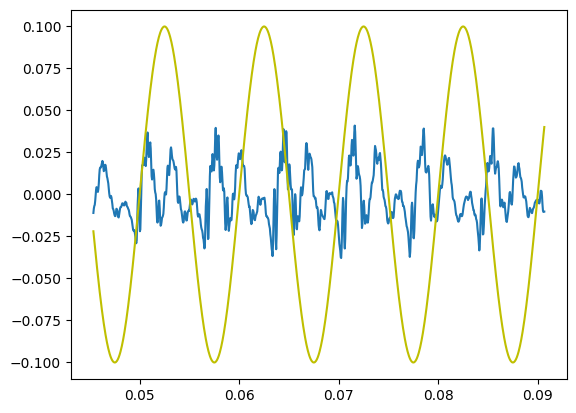

In [102]:
samples = range(len(aud_1_trim))
t = librosa.samples_to_time(samples, sr=sr)
f=100
phase=0

sin = 0.1 * np.sin(2*np.pi * (f * t - phase))

plt.plot(t[1000:2000], aud_1_trim[1000:2000])
plt.plot(t[1000:2000], sin[1000:2000], color='y')
plt.show()

In [103]:
s = librosa.stft(aud_1_trim)
s_db = librosa.amplitude_to_db(np.absolute(s))

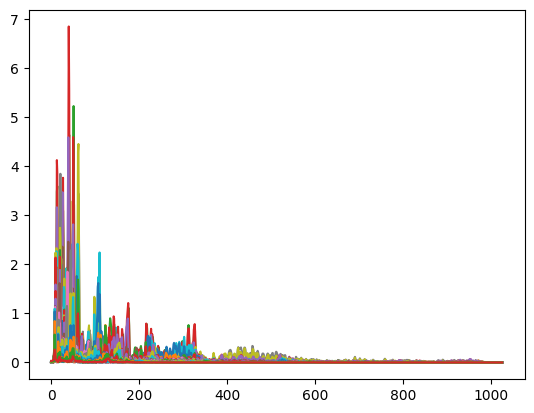

In [104]:
m = np.abs(s)
freq= np.linspace(0,len(s),len(m))
plt.plot(freq,m)

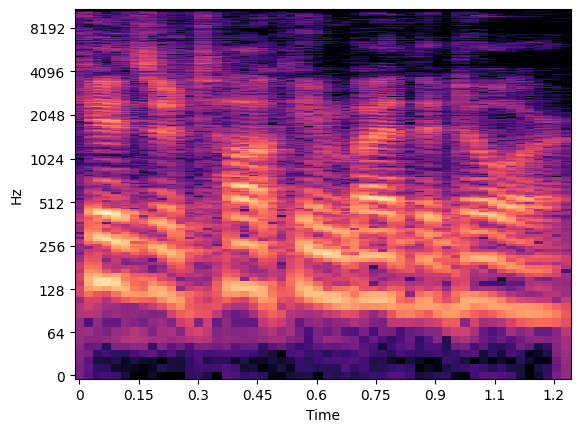

In [105]:
librosa.display.specshow(s_db, x_axis='time', y_axis='log')

In [106]:
s_mel = librosa.feature.melspectrogram(y=aud_1_trim)
s_db_mel = librosa.amplitude_to_db(np.absolute(s_mel))

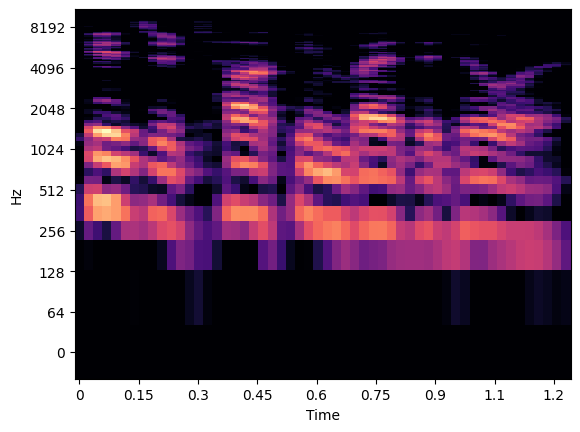

In [107]:
librosa.display.specshow(s_db_mel, x_axis='time', y_axis='log')

In [108]:
def plot_mel_spectrogram(signal, sr, frame_length, hop_size,title, n_mels=40):
    S_mel = librosa.feature.melspectrogram(y=signal,
                                           n_fft=frame_length,
                                           hop_length=hop_size,
                                           n_mels=n_mels,
                                           sr=sr,
                                          )
    log_mel_spectrogram = librosa.power_to_db(S_mel)
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(log_mel_spectrogram,
                             sr=sr,
                             x_axis='time',
                             y_axis='mel')
    plt.colorbar(format='%+2.f')
    plt.title(title)
    plt.show()

File naming convention

Each of the 1440 files has a unique filename. The filename consists of a 7-part numerical identifier (e.g., 03-01-06-01-02-01-12.wav). These identifiers define the stimulus characteristics:

Filename identifiers

Modality (01 = full-AV, 02 = video-only, 03 = audio-only).

Vocal channel (01 = speech, 02 = song).

Emotion (01 = neutral, 02 = calm, 03 = happy, 04 = sad, 05 = angry, 06 = fearful, 07 = disgust, 08 = surprised).

Emotional intensity (01 = normal, 02 = strong). NOTE: There is no strong intensity for the 'neutral' emotion.

Statement (01 = "Kids are talking by the door", 02 = "Dogs are sitting by the door").

Repetition (01 = 1st repetition, 02 = 2nd repetition).

Actor (01 to 24. Odd numbered actors are male, even numbered actors are female).

Filename example: 03-01-06-01-02-01-12.wav

Audio-only (03)
Speech (01)
Fearful (06)
Normal intensity (01)
Statement "dogs" (02)
1st Repetition (01)
12th Actor (12)
Female, as the actor ID number is even.

In [110]:
# Actor 1 sound
actor1_aud_neutal = '/kaggle/input/ravdess-emotional-speech-audio/Actor_01/03-01-01-01-01-01-01.wav'
actor1_aud_calm = '/kaggle/input/ravdess-emotional-speech-audio/Actor_01/03-01-02-01-01-01-01.wav'
actor1_aud_happy = '/kaggle/input/ravdess-emotional-speech-audio/Actor_01/03-01-03-01-01-01-01.wav'
actor1_aud_sad = '/kaggle/input/ravdess-emotional-speech-audio/Actor_01/03-01-04-01-01-01-01.wav'
actor1_aud_angry = '/kaggle/input/ravdess-emotional-speech-audio/Actor_01/03-01-05-01-01-01-01.wav'
actor1_aud_fearful = '/kaggle/input/ravdess-emotional-speech-audio/Actor_01/03-01-06-01-01-01-01.wav'
actor1_aud_disgust = '/kaggle/input/ravdess-emotional-speech-audio/Actor_01/03-01-07-01-01-01-01.wav'
actor1_aud_surprise = '/kaggle/input/ravdess-emotional-speech-audio/Actor_01/03-01-08-01-01-01-01.wav'

actor1_aud_neutal, sr = librosa.load(actor1_aud_neutal)
actor1_aud_calm, _ = librosa.load(actor1_aud_calm)
actor1_aud_happy, _ = librosa.load(actor1_aud_happy)
actor1_aud_sad, _ = librosa.load(actor1_aud_sad)
actor1_aud_angry, _ = librosa.load(actor1_aud_angry)
actor1_aud_fearful, _ = librosa.load(actor1_aud_fearful)
actor1_aud_disgust, _ = librosa.load(actor1_aud_disgust)
actor1_aud_surprise, _ = librosa.load(actor1_aud_surprise)


# actor1_aud_1_trim = librosa.effects.trim(actor1_aud_1, top_db=30)[0]
# actor1_aud_2_trim = librosa.effects.trim(actor1_aud_2, top_db=30)[0]
# actor1_aud_3_trim = librosa.effects.trim(actor1_aud_3, top_db=30)[0]
# actor1_aud_4_trim = librosa.effects.trim(actor1_aud_4, top_db=30)[0]
# actor1_aud_5_trim = librosa.effects.trim(actor1_aud_5, top_db=30)[0]


In [111]:
# ipd.Audio(data=actor1_aud_neutal, rate=sr)
# ipd.Audio(data=actor1_aud_calm, rate=sr)
# ipd.Audio(data=actor1_aud_happy, rate=sr)
# ipd.Audio(data=actor1_aud_angry, rate=sr)
# ipd.Audio(data=actor1_aud_sad, rate=sr)
# ipd.Audio(data=actor1_aud_fearful, rate=sr)
# ipd.Audio(data=actor1_aud_disgust, rate=sr)
# ipd.Audio(data=actor1_aud_surprise, rate=sr)

In [112]:
ipd.Audio(data=actor1_aud_neutal, rate=sr)

In [113]:
ipd.Audio(data=actor1_aud_calm, rate=sr)

In [114]:
ipd.Audio(data=actor1_aud_happy, rate=sr)

In [115]:
ipd.Audio(data=actor1_aud_sad, rate=sr)

In [116]:
ipd.Audio(data=actor1_aud_angry, rate=sr)

In [117]:
ipd.Audio(data=actor1_aud_fearful, rate=sr)

In [118]:
ipd.Audio(data=actor1_aud_disgust, rate=sr)

In [119]:
ipd.Audio(data=actor1_aud_surprise, rate=sr)

In [120]:
# ipd.Audio(data=actor1_aud_neutal, rate=sr)
# ipd.Audio(data=actor1_aud_calm, rate=sr)
# ipd.Audio(data=actor1_aud_happy, rate=sr)
# ipd.Audio(data=actor1_aud_angry, rate=sr)
# ipd.Audio(data=actor1_aud_sad, rate=sr)
# ipd.Audio(data=actor1_aud_fearful, rate=sr)
# ipd.Audio(data=actor1_aud_disgust, rate=sr)
# ipd.Audio(data=actor1_aud_surprise, rate=sr)

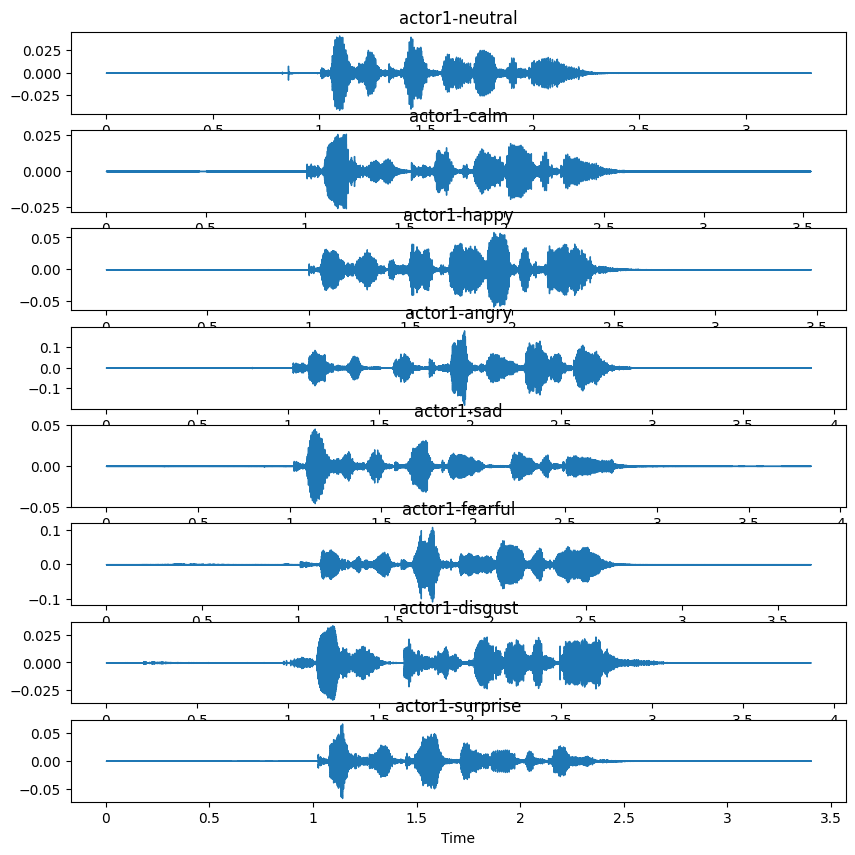

In [121]:
plt.figure(figsize=(10,10))
plt.subplot(811)
librosa.display.waveshow(actor1_aud_neutal)
plt.title("actor1-neutral")
plt.subplot(812)
librosa.display.waveshow(actor1_aud_calm)
plt.title("actor1-calm")
plt.subplot(813)
librosa.display.waveshow(actor1_aud_happy)
plt.title("actor1-happy")
plt.subplot(814)
librosa.display.waveshow(actor1_aud_angry)
plt.title("actor1-angry")
plt.subplot(815)
librosa.display.waveshow(actor1_aud_sad)
plt.title("actor1-sad")
plt.subplot(816)
librosa.display.waveshow(actor1_aud_fearful)
plt.title("actor1-fearful")
plt.subplot(817)
librosa.display.waveshow(actor1_aud_disgust)
plt.title("actor1-disgust")
plt.subplot(818)
librosa.display.waveshow(actor1_aud_surprise)
plt.title("actor1-surprise")
plt.show()


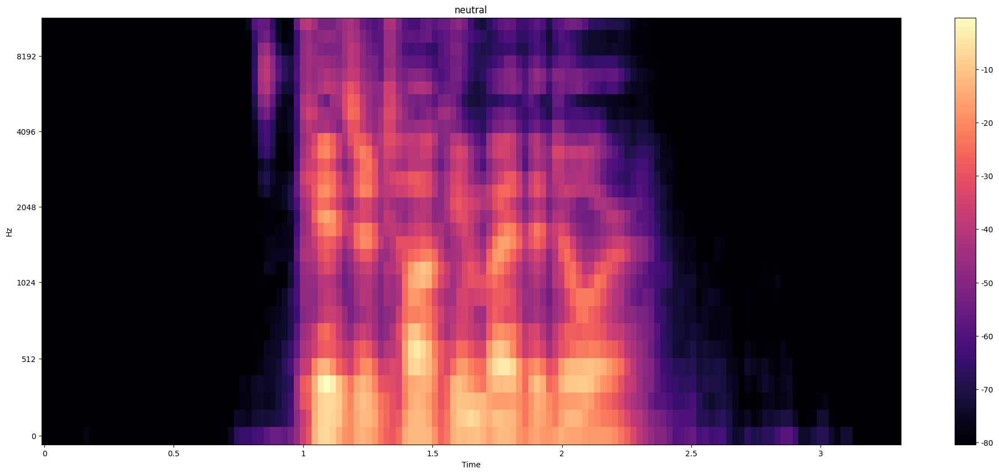

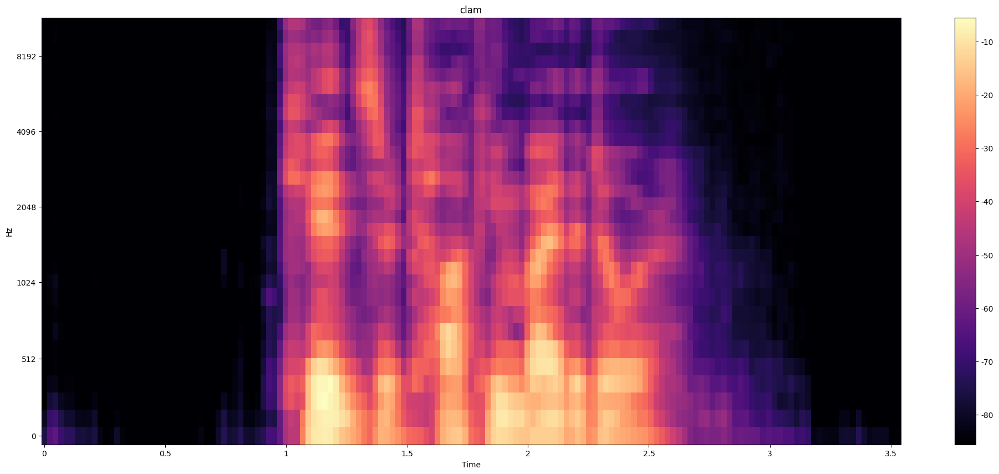

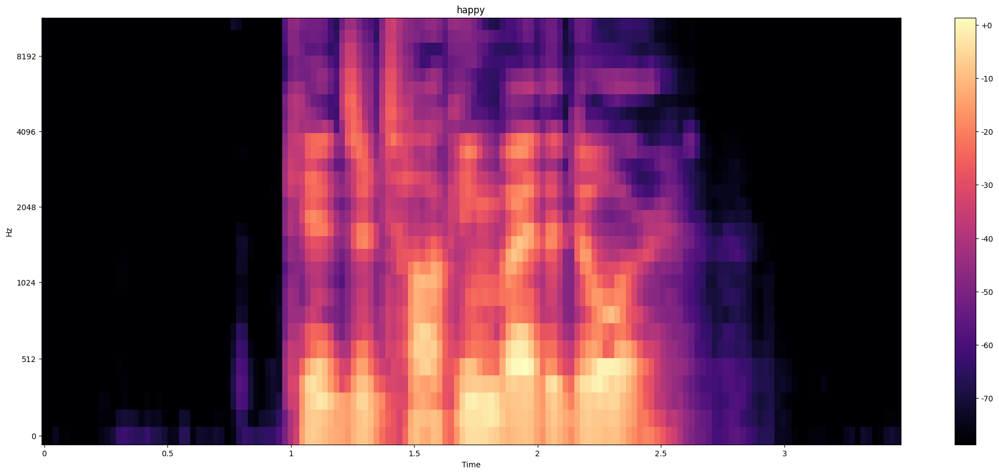

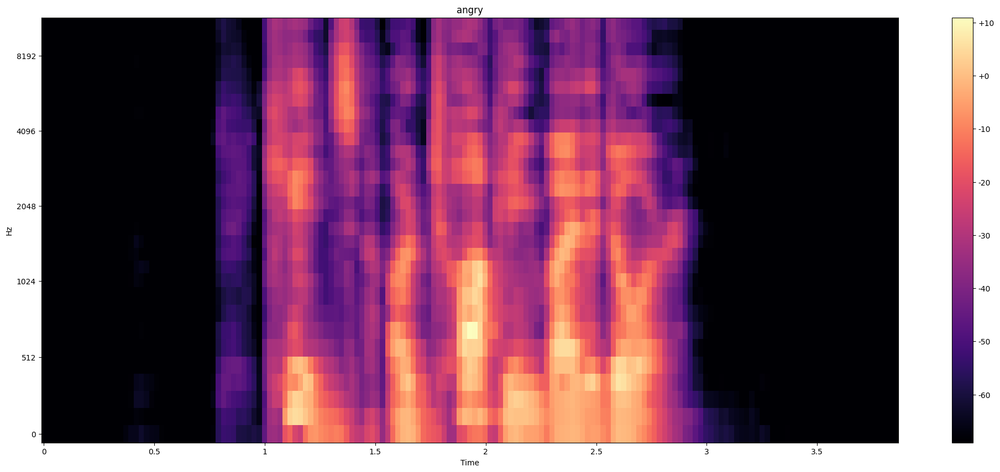

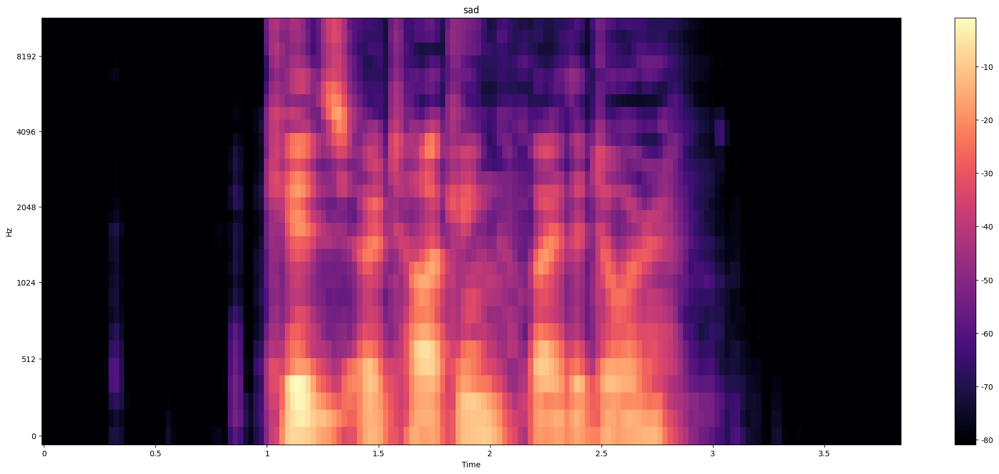

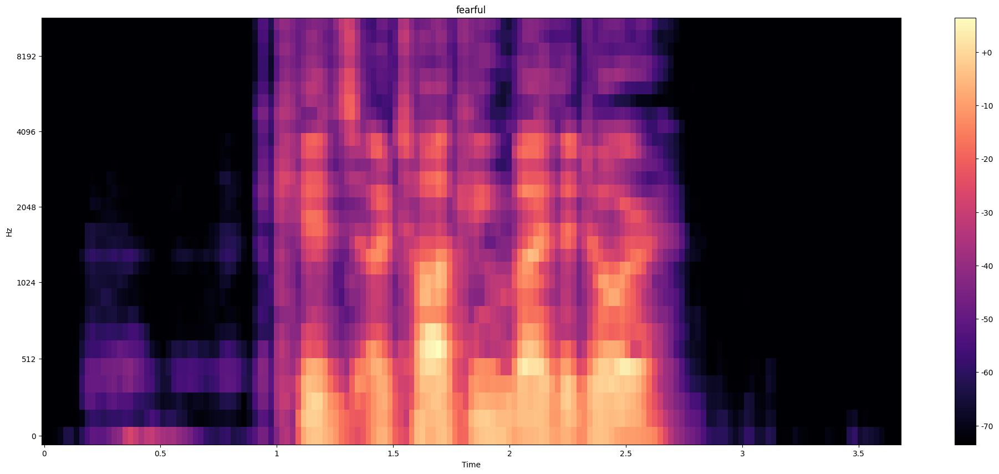

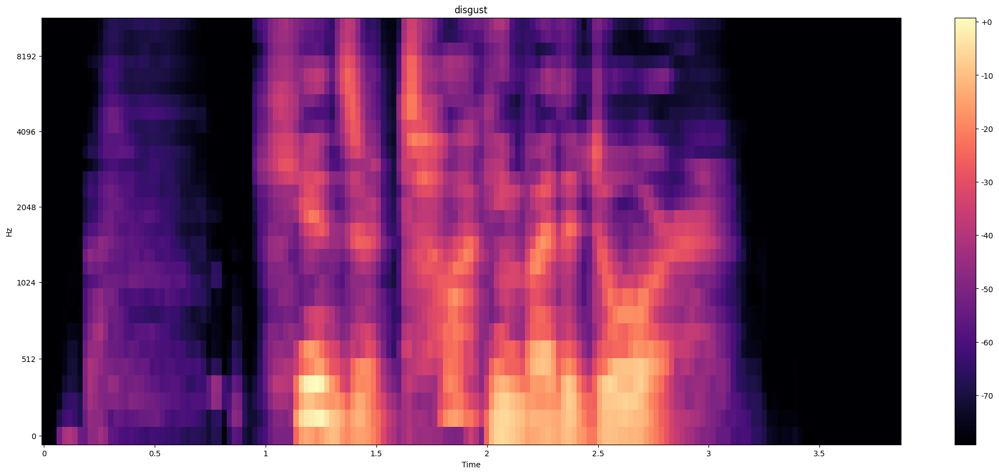

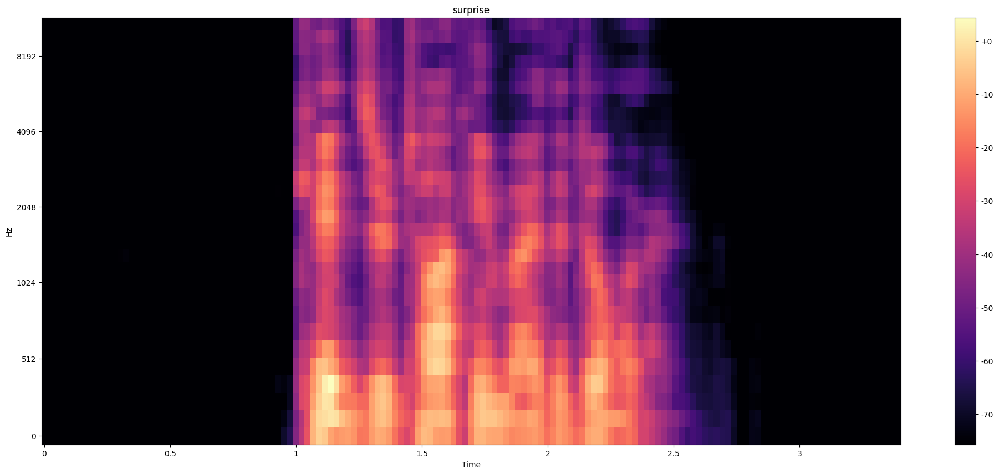

In [177]:
FRAME_LENGTH = 2048
HOP_SIZE = 512
N_MELS = 30

plot_mel_spectrogram(signal=actor1_aud_neutal,
                     sr=sr,
                     frame_length=FRAME_LENGTH,
                     hop_size=HOP_SIZE,
                     title="neutral",
                     n_mels=N_MELS
                    )
plot_mel_spectrogram(signal=actor1_aud_calm,
                     sr=sr,
                     frame_length=FRAME_LENGTH,
                     hop_size=HOP_SIZE,
                     title="clam",
                     n_mels=N_MELS
                    )
plot_mel_spectrogram(signal=actor1_aud_happy,
                     sr=sr,
                     frame_length=FRAME_LENGTH,
                     hop_size=HOP_SIZE,
                     title="happy",
                     n_mels=N_MELS
                    )
plot_mel_spectrogram(signal=actor1_aud_angry,
                     sr=sr,
                     frame_length=FRAME_LENGTH,
                     hop_size=HOP_SIZE,
                     title="angry",
                     n_mels=N_MELS
                    )
plot_mel_spectrogram(signal=actor1_aud_sad,
                     sr=sr,
                     frame_length=FRAME_LENGTH,
                     hop_size=HOP_SIZE,
                     title="sad",
                     n_mels=N_MELS
                    )
plot_mel_spectrogram(signal=actor1_aud_fearful,
                     sr=sr,
                     frame_length=FRAME_LENGTH,
                     hop_size=HOP_SIZE,
                     title="fearful",
                     n_mels=N_MELS
                    )
plot_mel_spectrogram(signal=actor1_aud_disgust,
                     sr=sr,
                     frame_length=FRAME_LENGTH,
                     hop_size=HOP_SIZE,
                     title="disgust",
                     n_mels=N_MELS
                    )
plot_mel_spectrogram(signal=actor1_aud_surprise,
                     sr=sr,
                     frame_length=FRAME_LENGTH,
                     hop_size=HOP_SIZE,
                     title="surprise",
                     n_mels=N_MELS
                    )


In [123]:
# Actor 1 sound
actor2_aud_neutral = '/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-01-01-01-01-02.wav'
actor2_aud_calm = '/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-02-01-01-01-02.wav'
actor2_aud_happy = '/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-03-01-01-01-02.wav'
actor2_aud_sad = '/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-04-01-01-01-02.wav'
actor2_aud_angry = '/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-05-01-01-01-02.wav'
actor2_aud_fearful = '/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-06-01-01-01-02.wav'
actor2_aud_disgust = '/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-07-01-01-01-02.wav'
actor2_aud_surprise = '/kaggle/input/ravdess-emotional-speech-audio/Actor_02/03-01-08-01-01-01-02.wav'

actor2_aud_neutral, sr = librosa.load(actor2_aud_neutral)
actor2_aud_calm, _ = librosa.load(actor2_aud_calm)
actor2_aud_happy, _ = librosa.load(actor2_aud_happy)
actor2_aud_sad, _ = librosa.load(actor2_aud_sad)
actor2_aud_angry, _ = librosa.load(actor2_aud_angry)
actor2_aud_fearful, _ = librosa.load(actor2_aud_fearful)
actor2_aud_disgust, _ = librosa.load(actor2_aud_disgust)
actor2_aud_surprise, _ = librosa.load(actor2_aud_surprise)


# actor1_aud_1_trim = librosa.effects.trim(actor1_aud_1, top_db=30)[0]
# actor1_aud_2_trim = librosa.effects.trim(actor1_aud_2, top_db=30)[0]
# actor1_aud_3_trim = librosa.effects.trim(actor1_aud_3, top_db=30)[0]
# actor1_aud_4_trim = librosa.effects.trim(actor1_aud_4, top_db=30)[0]
# actor1_aud_5_trim = librosa.effects.trim(actor1_aud_5, top_db=30)[0]


In [125]:
actor2_aud_neutral

array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
       -1.2893084e-06,  1.0079405e-06, -7.8646383e-07], dtype=float32)

In [126]:
ipd.Audio(data=actor2_aud_neutral, rate=sr)

In [127]:
ipd.Audio(data=actor2_aud_calm, rate=sr)

In [128]:
ipd.Audio(data=actor2_aud_happy, rate=sr)

In [129]:
ipd.Audio(data=actor2_aud_angry, rate=sr)

In [130]:
ipd.Audio(data=actor2_aud_sad, rate=sr)

In [131]:
ipd.Audio(data=actor2_aud_fearful, rate=sr)

In [132]:
ipd.Audio(data=actor2_aud_disgust, rate=sr)

In [133]:
ipd.Audio(data=actor2_aud_surprise, rate=sr)

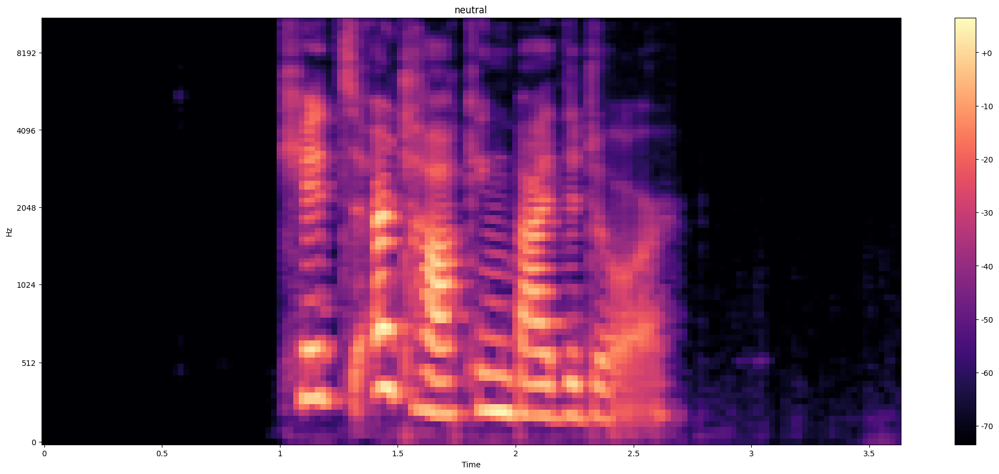

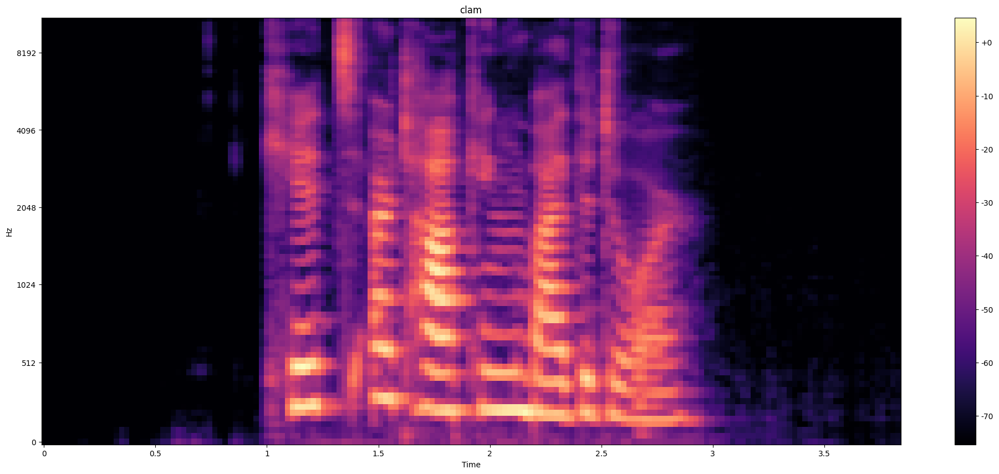

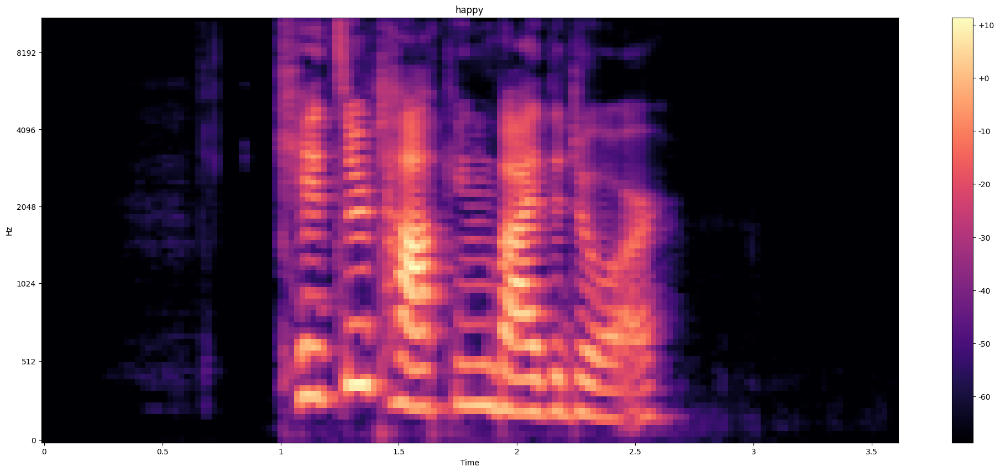

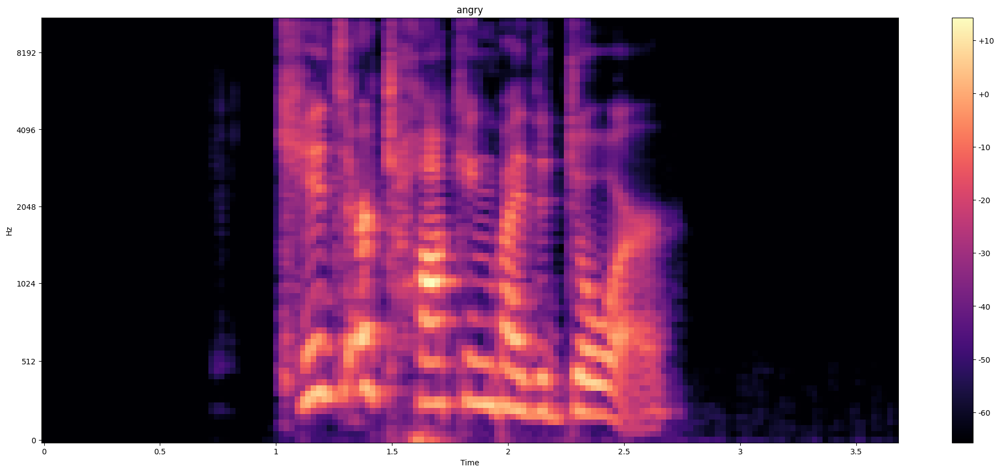

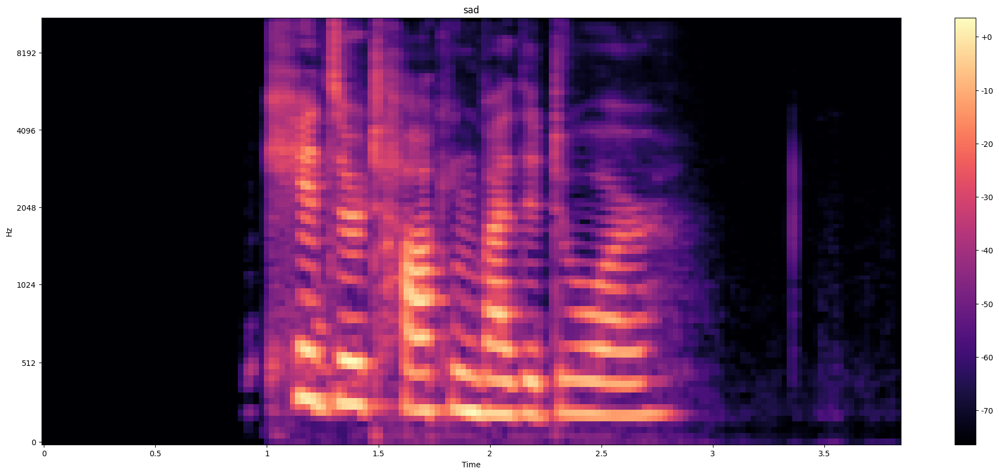

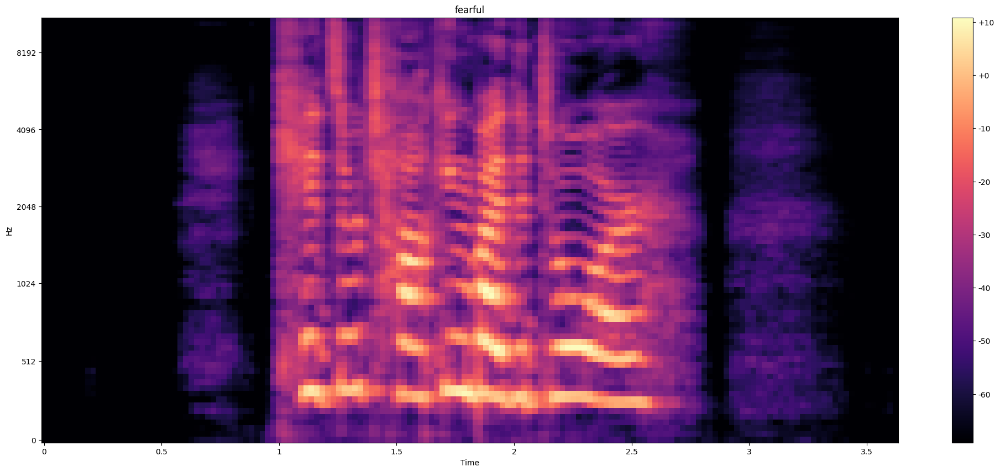

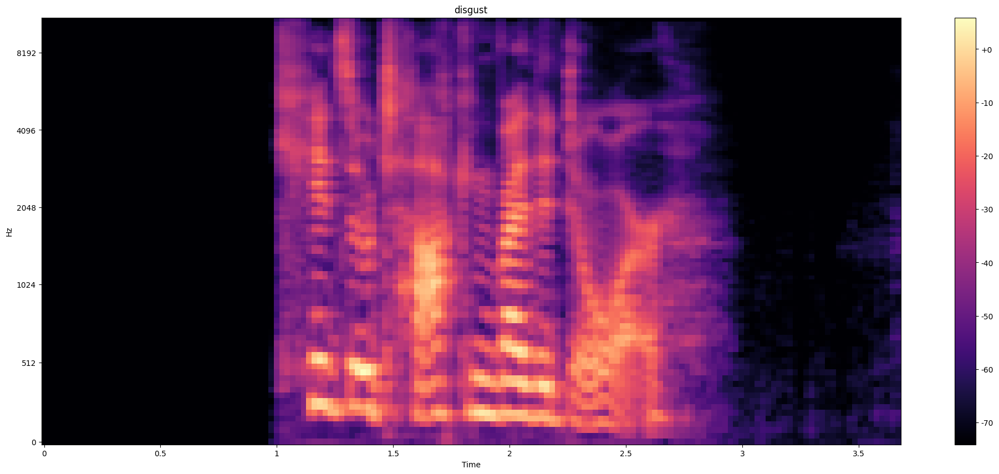

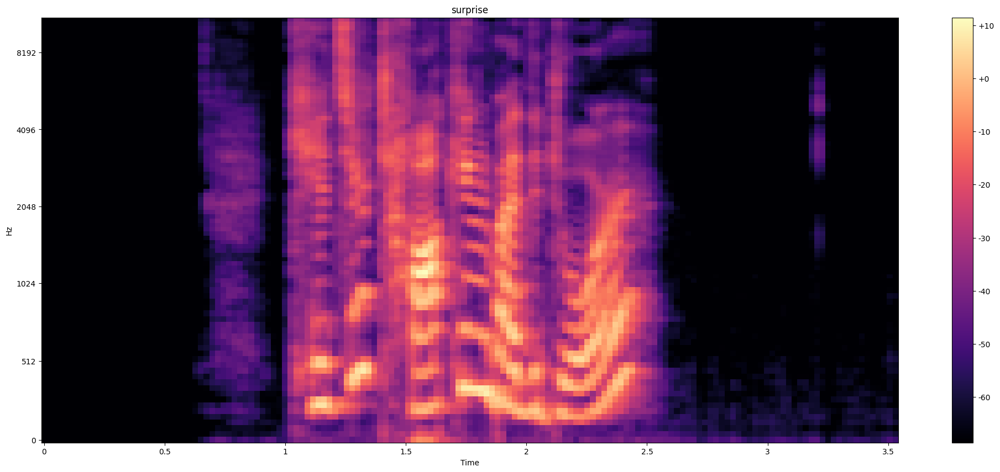

In [135]:
FRAME_LENGTH = 2048
HOP_SIZE = 512
N_MELS = 90

plot_mel_spectrogram(signal=actor2_aud_neutral,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="neutral",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor2_aud_calm,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="clam",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor2_aud_happy,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="happy",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor2_aud_angry,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="angry",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor2_aud_sad,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="sad",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor2_aud_fearful,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="fearful",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor2_aud_disgust,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="disgust",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor2_aud_surprise,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="surprise",n_mels=N_MELS)


In [136]:
# Actor 1 sound
actor3_aud_neutral = '/kaggle/input/ravdess-emotional-speech-audio/Actor_03/03-01-01-01-01-01-03.wav'
actor3_aud_calm = '/kaggle/input/ravdess-emotional-speech-audio/Actor_03/03-01-02-01-01-01-03.wav'
actor3_aud_happy = '/kaggle/input/ravdess-emotional-speech-audio/Actor_03/03-01-03-01-01-01-03.wav'
actor3_aud_sad = '/kaggle/input/ravdess-emotional-speech-audio/Actor_03/03-01-04-01-01-01-03.wav'
actor3_aud_angry = '/kaggle/input/ravdess-emotional-speech-audio/Actor_03/03-01-05-01-01-01-03.wav'
actor3_aud_fearful = '/kaggle/input/ravdess-emotional-speech-audio/Actor_03/03-01-06-01-01-01-03.wav'
actor3_aud_disgust = '/kaggle/input/ravdess-emotional-speech-audio/Actor_03/03-01-07-01-01-01-03.wav'
actor3_aud_surprise = '/kaggle/input/ravdess-emotional-speech-audio/Actor_03/03-01-08-01-01-01-03.wav'

actor3_aud_neutral, sr = librosa.load(actor3_aud_neutral)
actor3_aud_calm, _ = librosa.load(actor3_aud_calm)
actor3_aud_happy, _ = librosa.load(actor3_aud_happy)
actor3_aud_sad, _ = librosa.load(actor3_aud_sad)
actor3_aud_angry, _ = librosa.load(actor3_aud_angry)
actor3_aud_fearful, _ = librosa.load(actor3_aud_fearful)
actor3_aud_disgust, _ = librosa.load(actor3_aud_disgust)
actor3_aud_surprise, _ = librosa.load(actor3_aud_surprise)


# actor1_aud_1_trim = librosa.effects.trim(actor1_aud_1, top_db=30)[0]
# actor1_aud_2_trim = librosa.effects.trim(actor1_aud_2, top_db=30)[0]
# actor1_aud_3_trim = librosa.effects.trim(actor1_aud_3, top_db=30)[0]
# actor1_aud_4_trim = librosa.effects.trim(actor1_aud_4, top_db=30)[0]
# actor1_aud_5_trim = librosa.effects.trim(actor1_aud_5, top_db=30)[0]




In [137]:
ipd.Audio(data=actor3_aud_neutral, rate=sr)

In [138]:
ipd.Audio(data=actor3_aud_calm, rate=sr)

In [139]:
ipd.Audio(data=actor3_aud_happy, rate=sr)

In [140]:
ipd.Audio(data=actor3_aud_angry, rate=sr)

In [141]:
ipd.Audio(data=actor3_aud_sad, rate=sr)

In [142]:
ipd.Audio(data=actor3_aud_fearful, rate=sr)

In [143]:
ipd.Audio(data=actor3_aud_disgust, rate=sr)

In [144]:
ipd.Audio(data=actor3_aud_surprise, rate=sr)

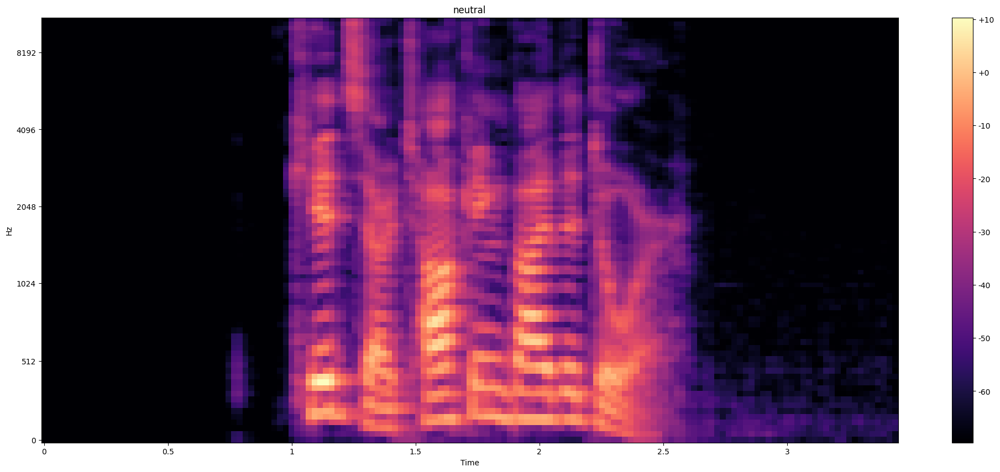

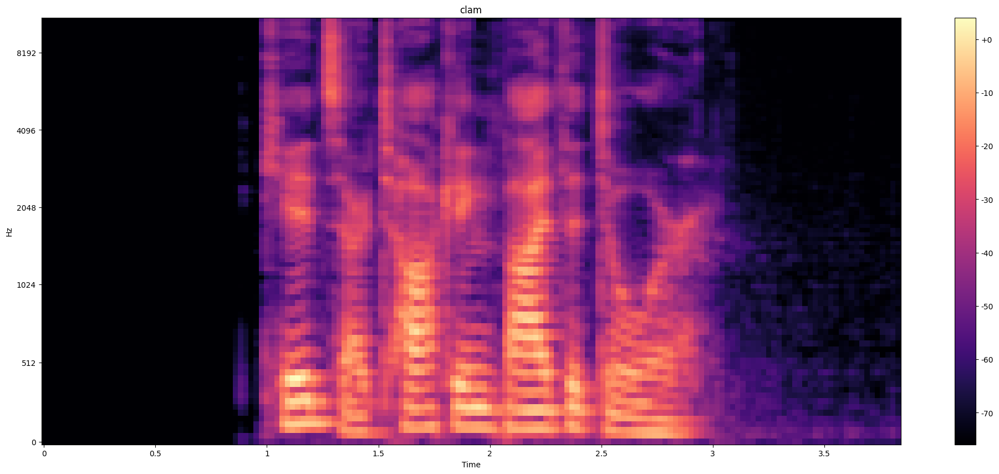

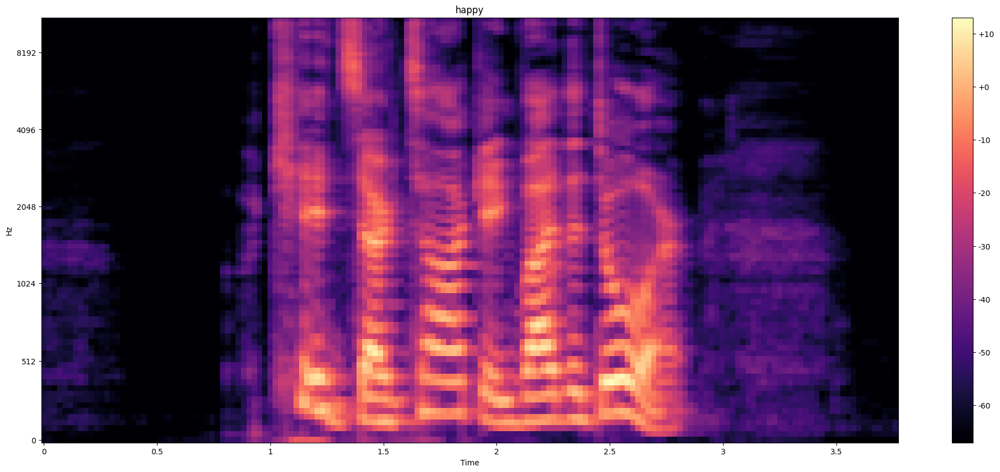

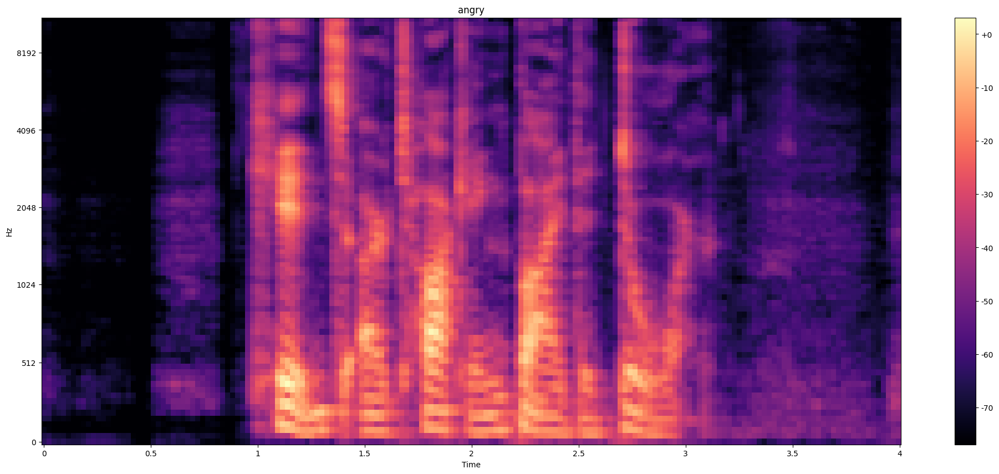

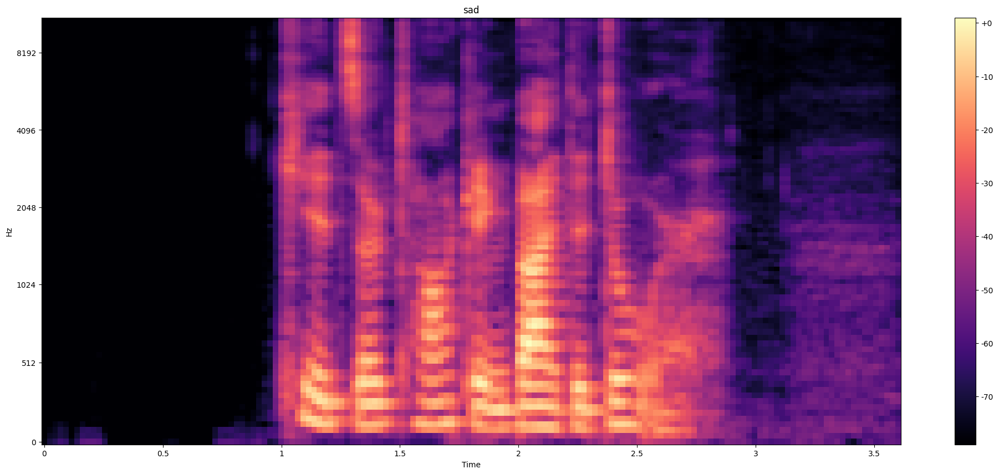

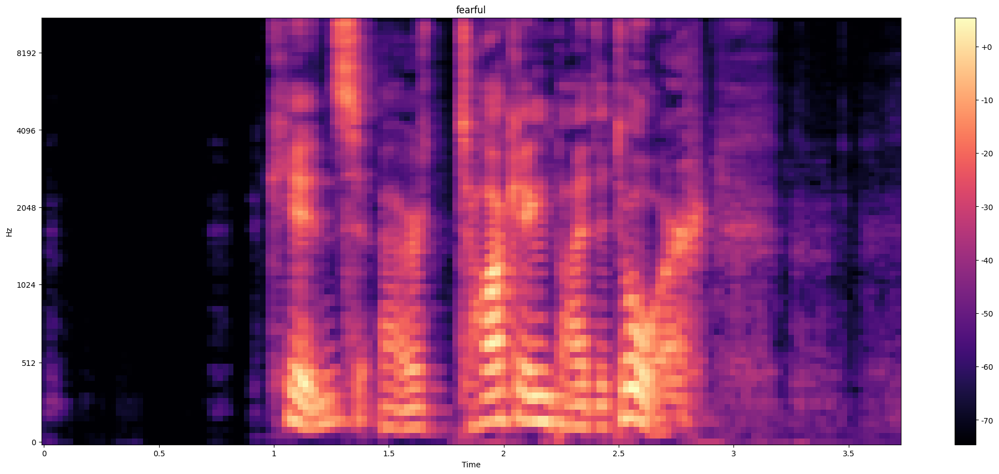

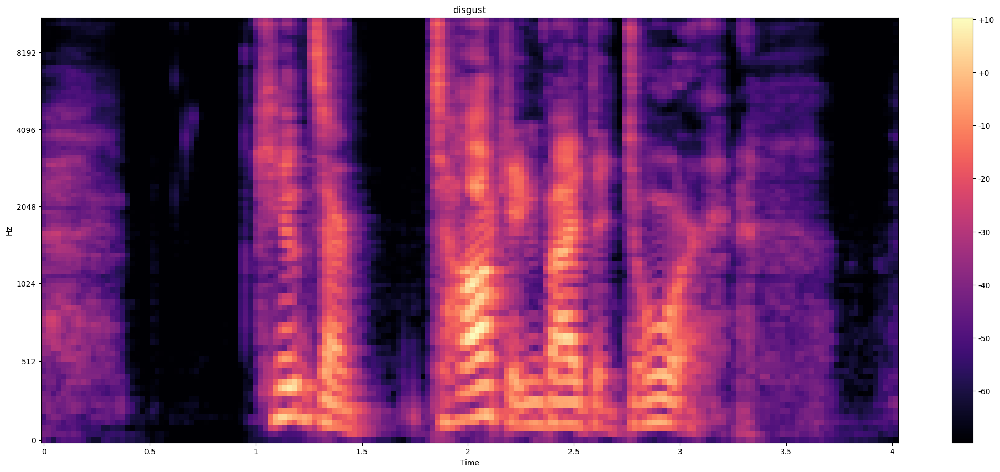

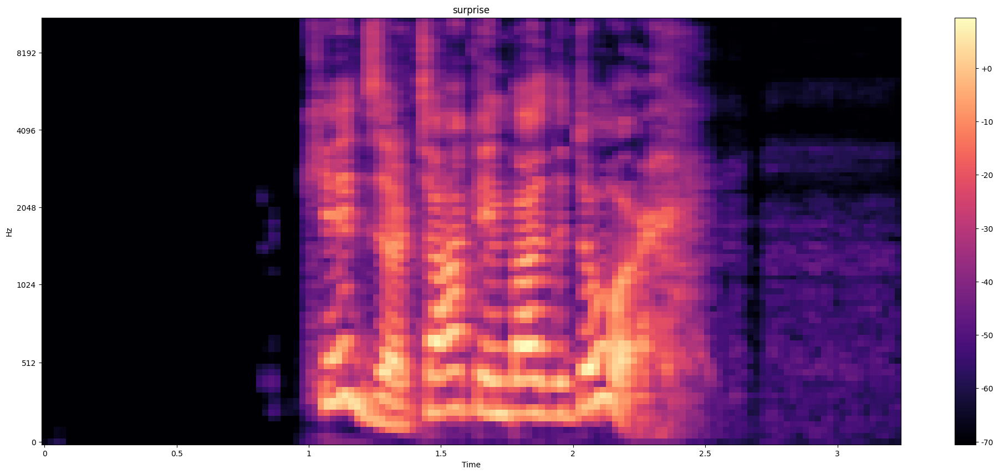

In [146]:
FRAME_LENGTH = 2048
HOP_SIZE = 512
N_MELS = 90

plot_mel_spectrogram(signal=actor3_aud_neutral,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="neutral",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor3_aud_calm,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="clam",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor3_aud_happy,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="happy",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor3_aud_angry,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="angry",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor3_aud_sad,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="sad",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor3_aud_fearful,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="fearful",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor3_aud_disgust,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="disgust",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor3_aud_surprise,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="surprise",n_mels=N_MELS)


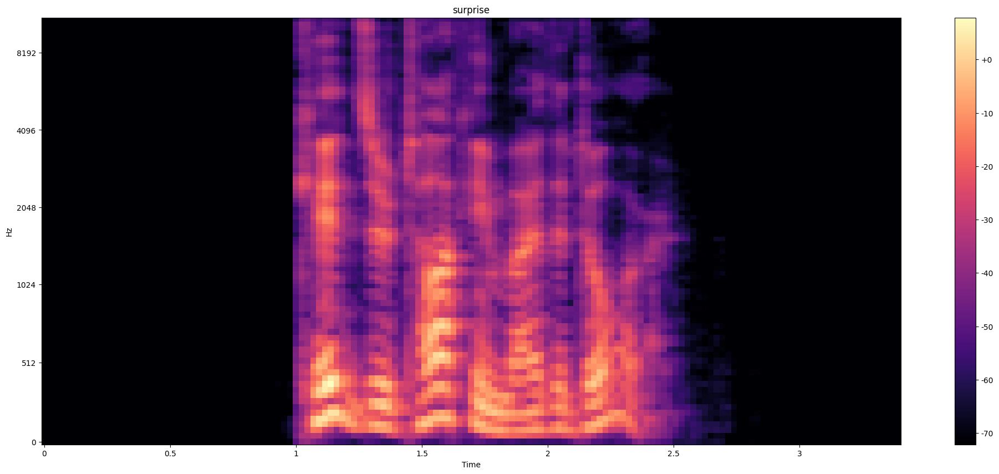

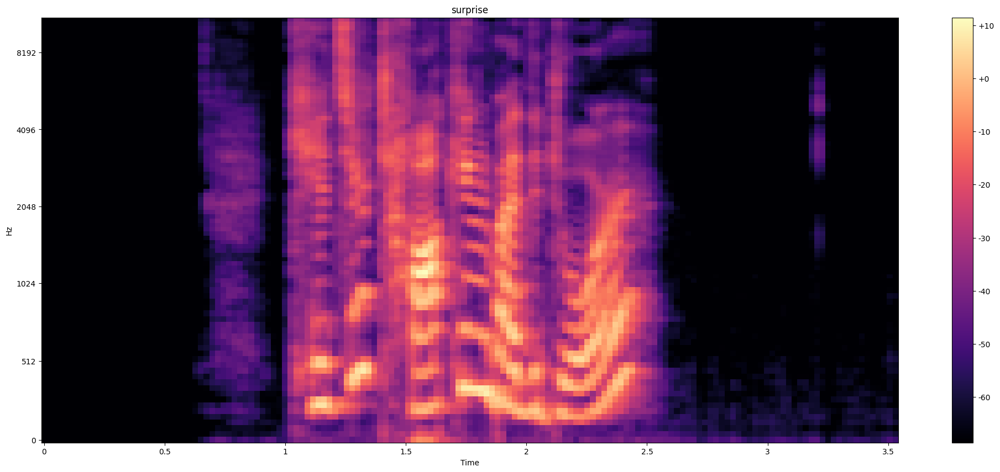

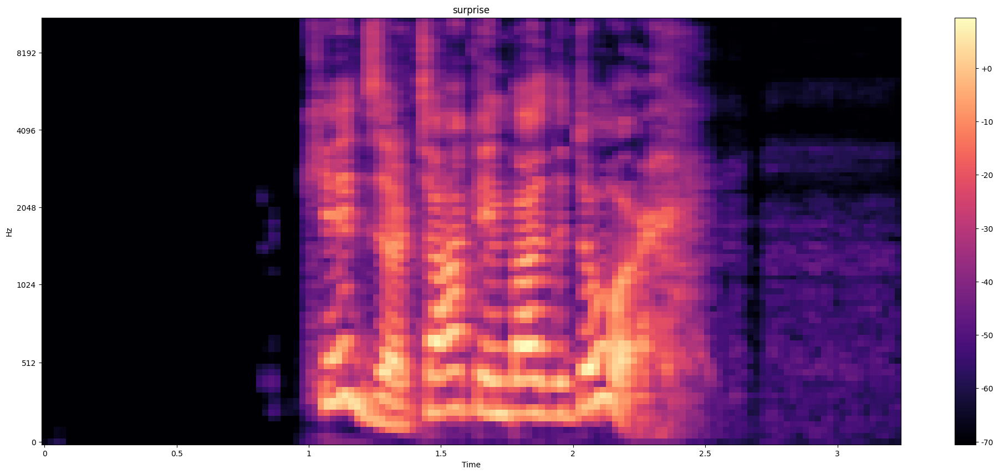

In [147]:
plot_mel_spectrogram(signal=actor1_aud_surprise,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="surprise",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor2_aud_surprise,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="surprise",n_mels=N_MELS)
plot_mel_spectrogram(signal=actor3_aud_surprise,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="surprise",n_mels=N_MELS)
# plot_mel_spectrogram(signal=actor2_aud_surprise,sr=sr,frame_length=FRAME_LENGTH,hop_size=HOP_SIZE,title="surprise",n_mels=N_MELS)


In [ ]:
, sr=sr)

In [168]:
def plot_mfcc(signal, sr, n_mfcc=13):
    mfccs = librosa.feature.mfcc(y=signal, n_mfcc=n_mfcc)
    
    plt.figure(figsize=(10,5))
    librosa.display.specshow(data=mfccs, x_axis="time", sr=sr)
    plt.colorbar(format="%+2.f")
    plt.show()

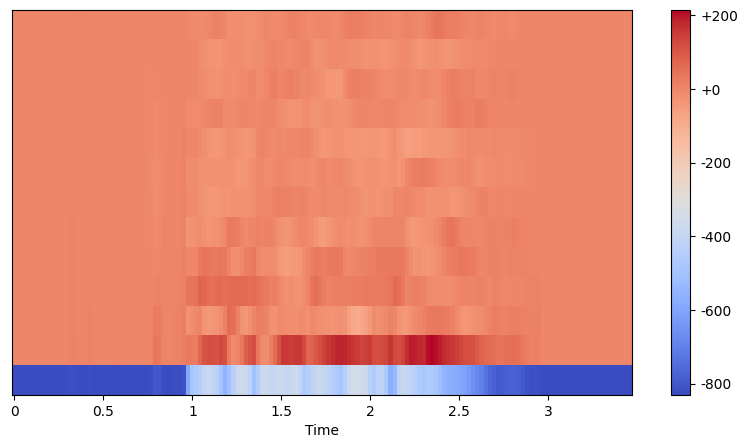

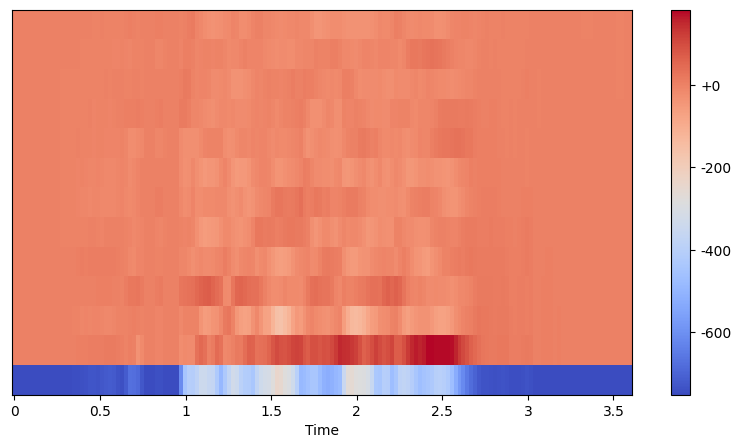

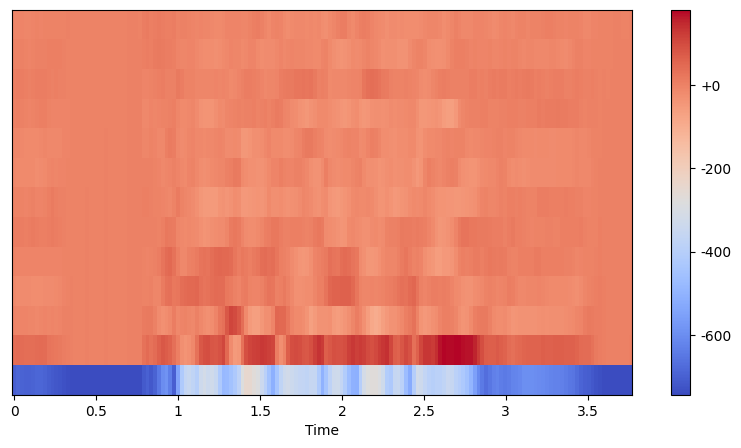

In [169]:
plot_mfcc(signal=actor1_aud_happy, sr=sr)
plot_mfcc(signal=actor2_aud_happy, sr=sr)
plot_mfcc(signal=actor3_aud_happy, sr=sr)

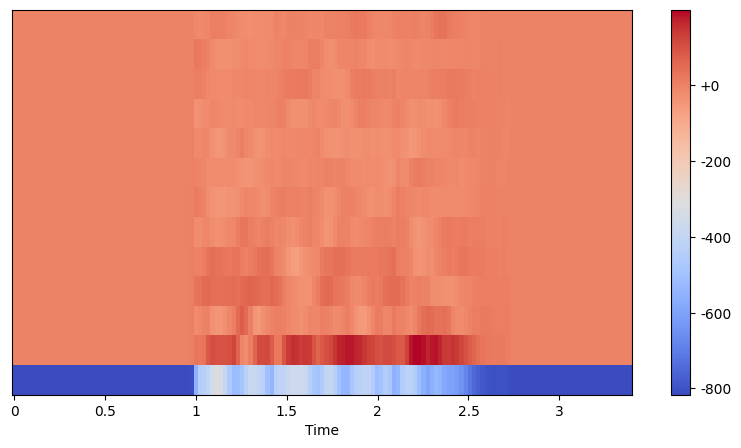

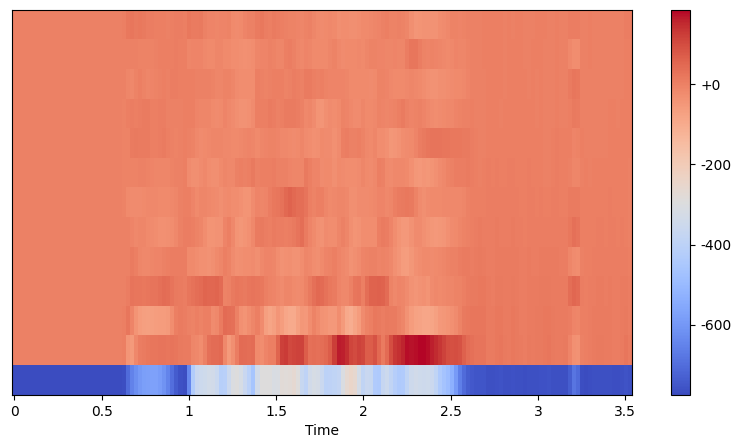

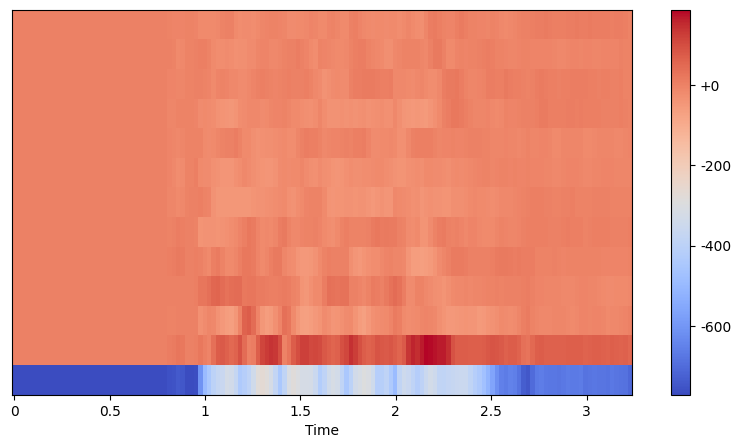

In [171]:
plot_mfcc(signal=actor1_aud_surprise, sr=sr)
plot_mfcc(signal=actor2_aud_surprise, sr=sr)
plot_mfcc(signal=actor3_aud_surprise, sr=sr)

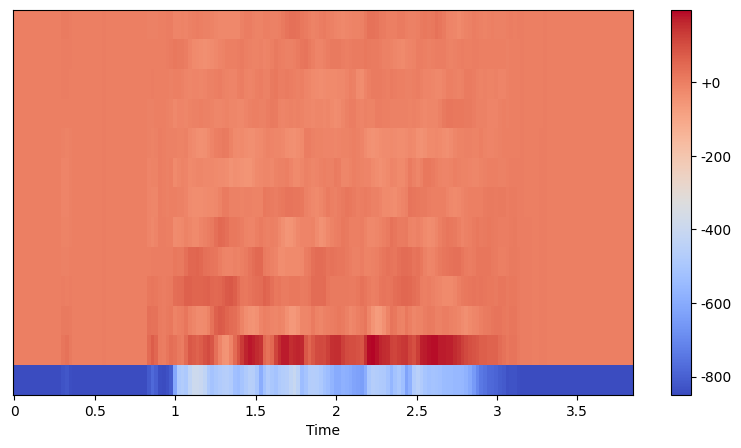

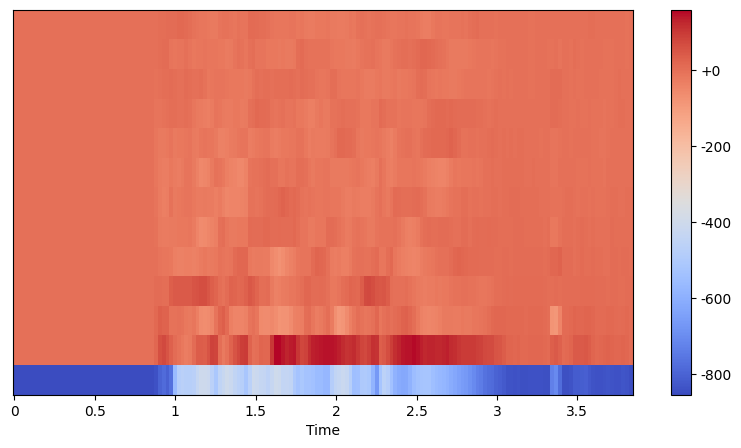

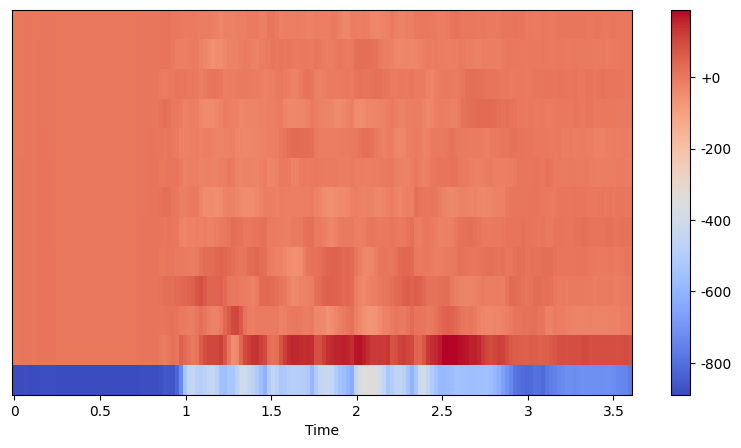

In [172]:
plot_mfcc(signal=actor1_aud_sad, sr=sr)
plot_mfcc(signal=actor2_aud_sad, sr=sr)
plot_mfcc(signal=actor3_aud_sad, sr=sr)

In [176]:
ipd.Audio(actor2_aud_surprise, rate=sr)